In [34]:
from PIL import Image  # Pillow library for opening and manipulating images
from skimage.io import imread, imshow, show  # skimage functions for reading and displaying images
import scipy.fftpack as fp  # Fourier Transform functions from SciPy
from scipy import ndimage, misc, signal  # Various image processing utilities
import imageio  # Image I/O operations
import matplotlib.pylab as plt  # Matplotlib for plotting and visualization
from skimage import data, img_as_float  # skimage utilities and float conversion
from skimage.color import rgb2gray  # Convert RGB images to grayscale
from skimage.transform import rescale  # Rescale images
import matplotlib.pylab as pylab  # Alternative Matplotlib import for settings
import numpy as np  # NumPy for numerical operations
import numpy.fft  # NumPy's Fast Fourier Transform functions
import timeit  # Measure execution time of code snippets
import PIL.ImageStat as stat  # Get image statistics like mean, median, etc.
import cv2  # OpenCV for advanced image processing and computer vision


0.9921568627450982
(256, 256)


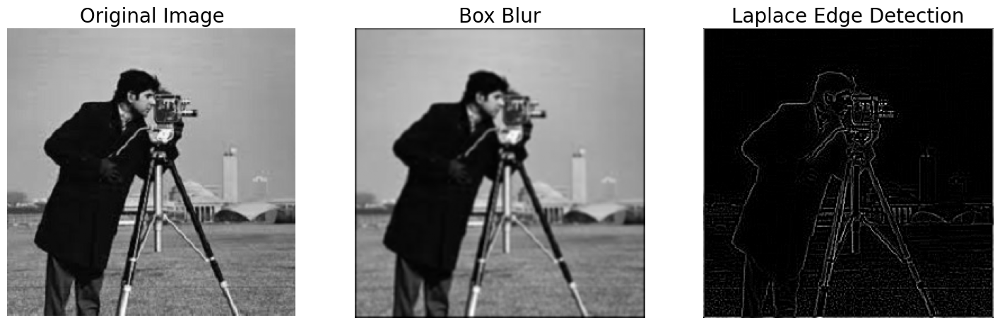

In [35]:


# Read the image, convert to grayscale, and convert to float type
im = rgb2gray(imread('/content/cameraman.jpg')).astype(float)

# Print the maximum pixel intensity value in the image
print(np.max(im))

# Print the shape of the image (height, width)
print(im.shape)

# Define a 3x3 box blur kernel (averaging filter)
blur_box_kernel = np.ones((3,3)) / 9

# Define a 3x3 Laplacian kernel for edge detection
edge_laplace_kernel = np.array([[0, 1, 0],
                                [1, -4, 1],
                                [0, 1, 0]])

# Apply box blur (smoothing) using 2D convolution
im_blurred = signal.convolve2d(im, blur_box_kernel)

# Apply Laplacian edge detection using 2D convolution
# Use np.clip to ensure pixel values remain in the range [0,1]
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)

# Create a figure with 3 subplots side by side
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18,6))

# Display the original grayscale image
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=20)

# Display the blurred image
axes[1].imshow(im_blurred, cmap=pylab.cm.gray)
axes[1].set_title('Box Blur', size=20)

# Display the edge-detected image
axes[2].imshow(im_edges, cmap=pylab.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)

# Remove axis labels for all subplots
for ax in axes:
    ax.axis('off')

# Show the plotted images
pylab.show()


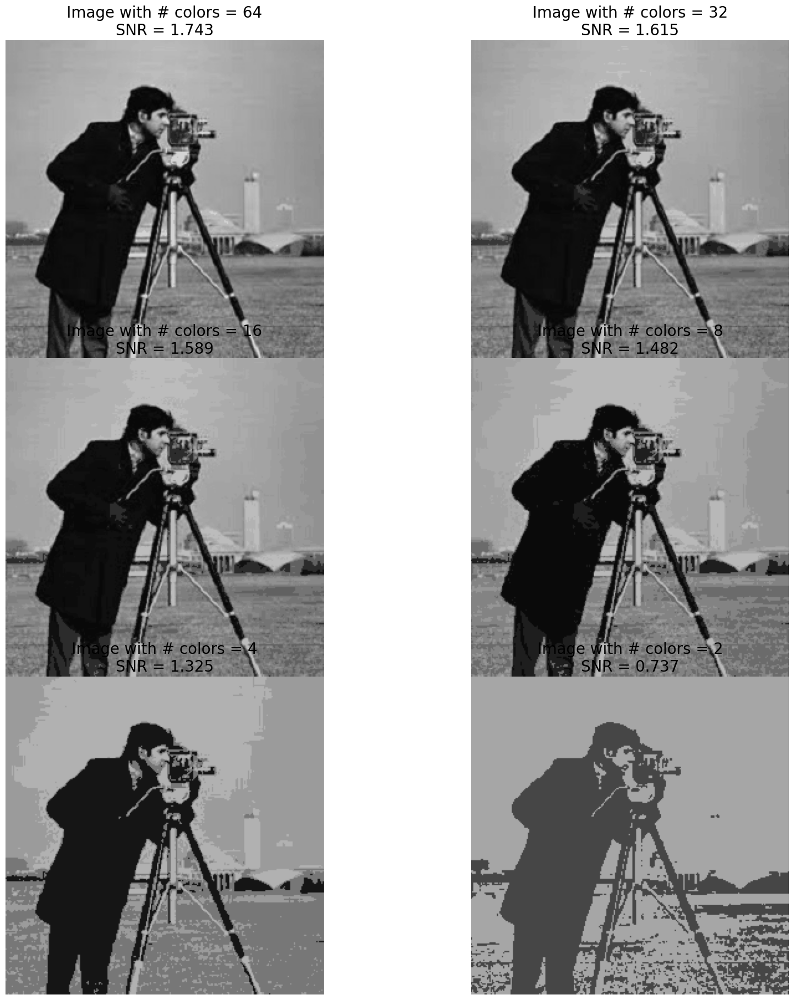

In [36]:
im = Image.open('/content/cameraman.jpg')

pylab.figure(figsize=(20, 30))

num_colors_list = [1 << n for n in range(6, 0, -1)]
snr_list = []

def signaltonoise(arr):
    return np.mean(arr) / (np.std(arr) + 1e-10)

for i, num_colors in enumerate(num_colors_list, start=1):
    im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
    im1_array = np.array(im1)
    snr_value = signaltonoise(im1_array)
    snr_list.append(snr_value)

    pylab.subplot(4, 2, i)
    pylab.imshow(im1, cmap='gray')
    pylab.axis('off')
    pylab.title(f'Image with # colors = {num_colors}\nSNR = {snr_value:.3f}', size=20)

pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

1.0
(203, 329, 3)


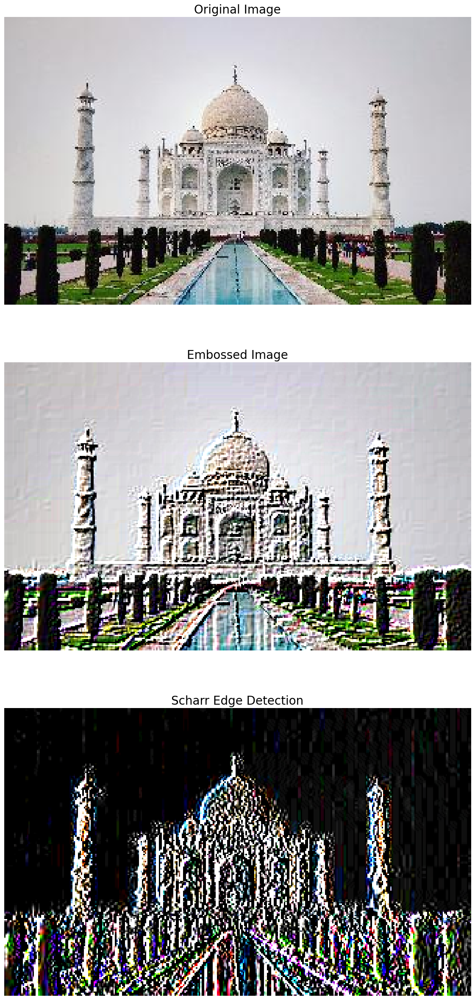

In [37]:


# Read the image and scale pixel values to the range [0,1]
im = imageio.v2.imread('/content/tajmahal_small.jpg') / 255

# Print the maximum pixel intensity value in the image
print(np.max(im))

# Print the shape of the image (height, width, channels)
print(im.shape)

# Define a 3x3 embossing kernel to create a 3D-like effect
emboss_kernel = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [ 0,  1, 2]])

# Define a 3x3 Scharr edge detection kernel (complex numbers for directional detection)
edge_schar_kernel = np.array([[-3-3j,  0-10j, +3-3j],
                              [-10+0j,  0+0j,  +10+0j],
                              [-3+3j,  0+10j, +3+3j]])

# Initialize embossed and edge-detected images with ones, keeping the same shape as the original
im_embossed = np.ones(im.shape)
im_edges = np.ones(im.shape)

# Apply the embossing filter to each color channel separately
for i in range(3):  # Loop over the 3 color channels (R, G, B)
    im_embossed[..., i] = np.clip(signal.convolve2d(im[..., i], emboss_kernel, mode='same', boundary="symm"), 0, 1)

# Apply the Scharr edge detection filter to each color channel separately
for i in range(3):  # Loop over the 3 color channels (R, G, B)
    im_edges[..., i] = np.clip(np.real(signal.convolve2d(im[..., i], edge_schar_kernel, mode='same', boundary="symm")), 0, 1)

# Create a figure with 3 subplots, arranged vertically
fig, axes = pylab.subplots(nrows=3, figsize=(20, 30))

# Display the original image
axes[0].imshow(im)
axes[0].set_title('Original Image', size=20)

# Display the embossed image
axes[1].imshow(im_embossed)
axes[1].set_title('Embossed Image', size=20)

# Display the edge-detected image
axes[2].imshow(im_edges)
axes[2].set_title('Scharr Edge Detection', size=20)

# Remove axis labels for all subplots
for ax in axes:
    ax.axis('off')

# Show the plotted images
pylab.show()


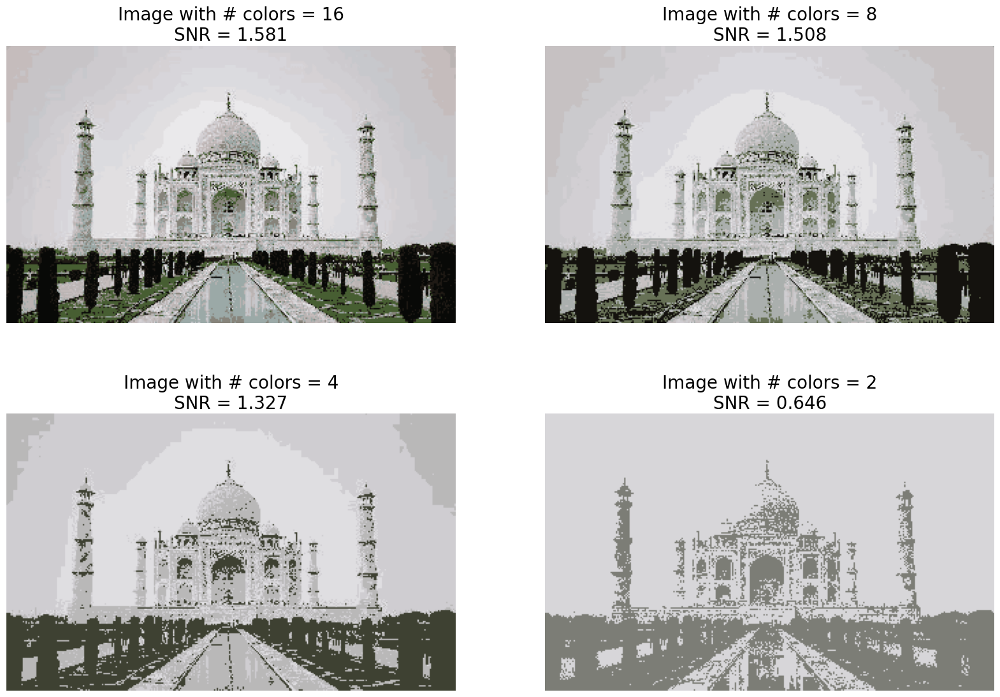

In [38]:
im = Image.open('/content/tajmahal_small.jpg')

pylab.figure(figsize=(20, 30))

num_colors_list = [1 << n for n in range(4, 0, -1)]
snr_list = []

def signaltonoise(arr):
    return np.mean(arr) / (np.std(arr) + 1e-10)

for i, num_colors in enumerate(num_colors_list, start=1):
    im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
    im1_array = np.array(im1)
    snr_value = signaltonoise(im1_array)
    snr_list.append(snr_value)

    pylab.subplot(4, 2, i)
    pylab.imshow(im1, cmap='gray')
    pylab.axis('off')
    pylab.title(f'Image with # colors = {num_colors}\nSNR = {snr_value:.3f}', size=20)

pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

255.0


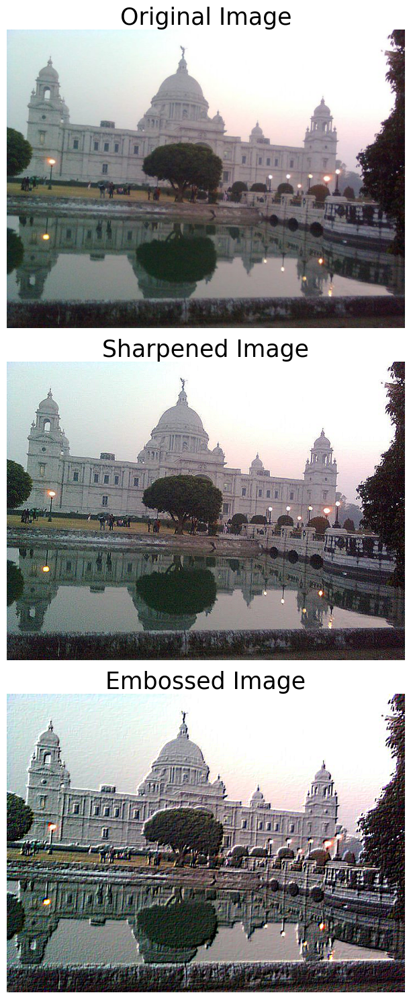

In [39]:


# Read the image and convert it to float type
im = imageio.v2.imread('/content/victoria_memorial.png').astype(float)

# Print the maximum pixel intensity value in the image
print(np.max(im))

# Define a 3x3 sharpening kernel
sharpen_kernel = np.array([0, -1, 0,
                           -1, 5, -1,
                            0, -1, 0]).reshape((3, 3, 1))  # Reshape for 3D convolution

# Define a 3x3 embossing kernel
emboss_kernel = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [ 0,  1, 2]]).reshape((3, 3, 1))  # Reshape for 3D convolution

# Apply sharpening filter using convolution
im_sharp = ndimage.convolve(im, sharpen_kernel, mode='nearest')

# Clip pixel values to the valid range [0, 255] and convert to unsigned int (uint8)
im_sharp = np.clip(im_sharp, 0, 255).astype(np.uint8)

# Apply embossing filter using convolution
im_emboss = ndimage.convolve(im, emboss_kernel, mode='nearest')

# Clip pixel values to the valid range [0, 255] and convert to unsigned int (uint8)
im_emboss = np.clip(im_emboss, 0, 255).astype(np.uint8)

# Create a figure for displaying images
pylab.figure(figsize=(10, 15))

# Display the original image
pylab.subplot(311), pylab.imshow(im.astype(np.uint8)), pylab.axis('off')
pylab.title('Original Image', size=25)

# Display the sharpened image
pylab.subplot(312), pylab.imshow(im_sharp), pylab.axis('off')
pylab.title('Sharpened Image', size=25)

# Display the embossed image
pylab.subplot(313), pylab.imshow(im_emboss), pylab.axis('off')
pylab.title('Embossed Image', size=25)

# Adjust layout to prevent overlapping
pylab.tight_layout()

# Show the images
pylab.show()


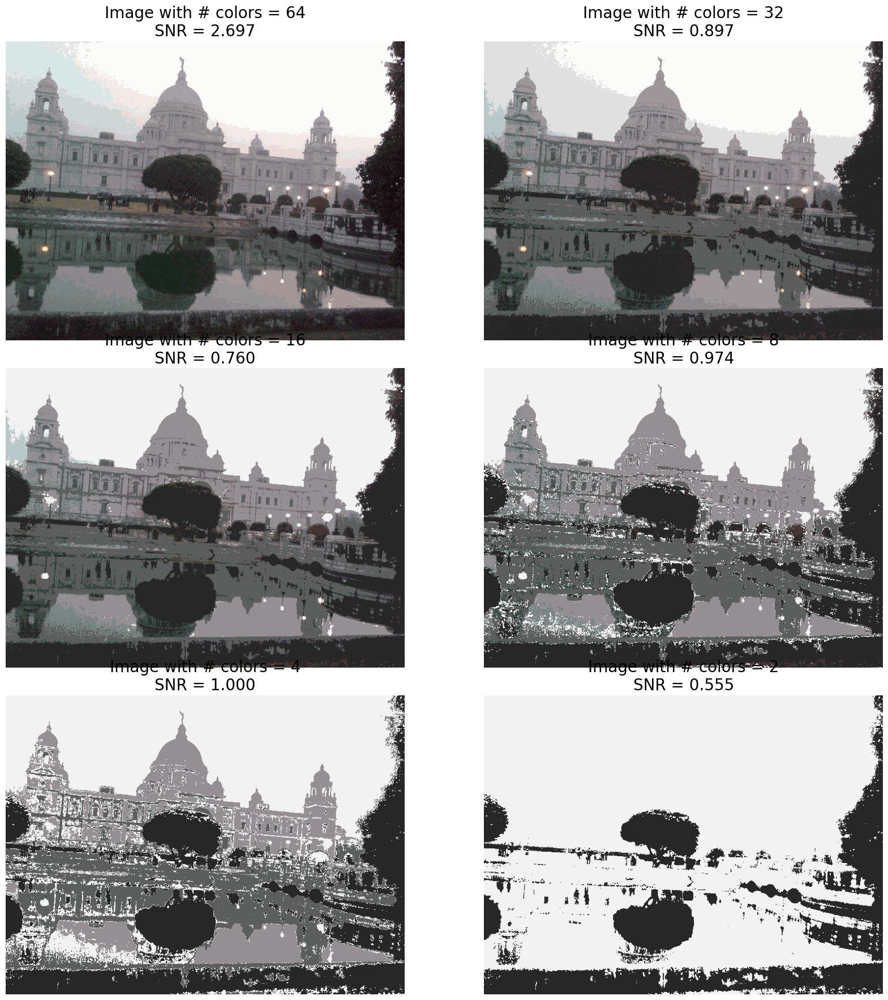

In [40]:
im = Image.open('/content/victoria_memorial.png')

pylab.figure(figsize=(20, 30))

num_colors_list = [1 << n for n in range(6, 0, -1)]
snr_list = []

def signaltonoise(arr):
    return np.mean(arr) / (np.std(arr) + 1e-10)

for i, num_colors in enumerate(num_colors_list, start=1):
    im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
    im1_array = np.array(im1)
    snr_value = signaltonoise(im1_array)
    snr_list.append(snr_value)

    pylab.subplot(4, 2, i)
    pylab.imshow(im1, cmap='gray')
    pylab.axis('off')
    pylab.title(f'Image with # colors = {num_colors}\nSNR = {snr_value:.3f}', size=20)

pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

<ipython-input-41-98e4c33440f6>:2: DeprecationWarning: scipy.misc.face has been deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. Dataset methods have moved into the scipy.datasets module. Use scipy.datasets.face instead.
  face_image = misc.face(gray=True).astype(float)


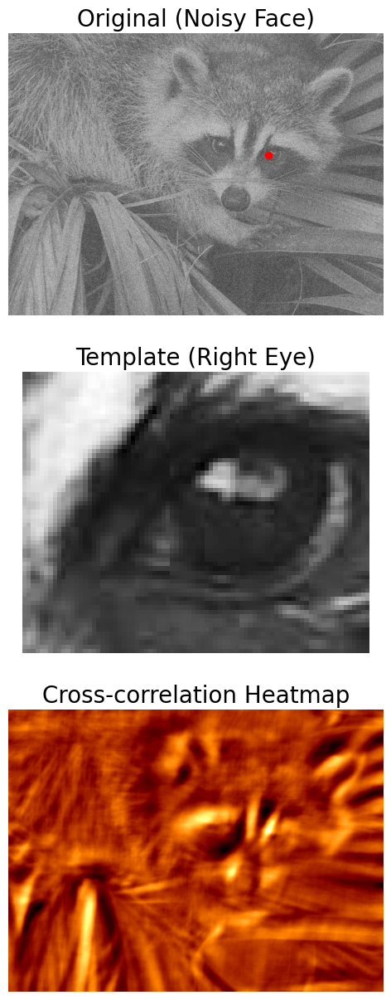

In [41]:


# Load the built-in "face" image and convert it to grayscale
face_image = misc.face(gray=True).astype(float)

# Normalize the image by subtracting the mean (to remove brightness bias)
face_image -= face_image.mean()

# Extract a small patch (template) from the right eye region
template_image = np.copy(face_image[300:365, 670:750])

# Normalize the template by subtracting its mean (to improve correlation detection)
template_image -= template_image.mean()

# Add random noise to the face image (simulating real-world noise)
face_image = face_image + np.random.randn(*face_image.shape) * 50  # Noise with std deviation of 50

# Perform 2D cross-correlation to find the best match of the template in the noisy image
correlation = signal.correlate2d(face_image, template_image, boundary='symm', mode='same')

# Find the coordinates (y, x) of the highest correlation value (best match location)
y, x = np.unravel_index(np.argmax(correlation), correlation.shape)

# Create a figure with 3 subplots (original image, template, correlation heatmap)
fig, (ax_original, ax_template, ax_correlation) = pylab.subplots(3, 1, figsize=(6, 15))

# Display the noisy face image
ax_original.imshow(face_image, cmap='gray')
ax_original.set_title('Original (Noisy Face)', size=20)
ax_original.set_axis_off()

# Display the template image (right eye region)
ax_template.imshow(template_image, cmap='gray')
ax_template.set_title('Template (Right Eye)', size=20)
ax_template.set_axis_off()

# Display the correlation heatmap (where the template matches best)
ax_correlation.imshow(correlation, cmap='afmhot')
ax_correlation.set_title('Cross-correlation Heatmap', size=20)
ax_correlation.set_axis_off()

# Mark the best match location with a red circle on the original image
ax_original.plot(x, y, 'ro')

# Show the figure
fig.show()


In [42]:
# Read the image using imageio
im = Image.open("/content/parrot.png") # Load an image (replace with your actual image path)

In [43]:
s = stat.Stat(im)

# Print the extrema (minimum and maximum pixel values) for each channel (R, G, B)
print(s.extrema)  # Output: [(min_R, max_R), (min_G, max_G), (min_B, max_B)]

# Print the total number of pixels in the image
print(s.count)  # Number of pixels per channel

# Print the mean pixel value for each channel
print(s.mean)  # Average intensity for R, G, and B channels

# Print the median pixel value for each channel
print(s.median)  # Median intensity for R, G, and B channels

# Print the standard deviation of pixel values for each channel
print(s.stddev)  # Measures contrast/variation in each channel


[(0, 255), (0, 255), (0, 253)]
[154020, 154020, 154020]
[125.41716010907675, 124.4158940397351, 68.46314764316323]
[117, 128, 63]
[47.763871467000165, 51.19863631276633, 39.29534599039047]


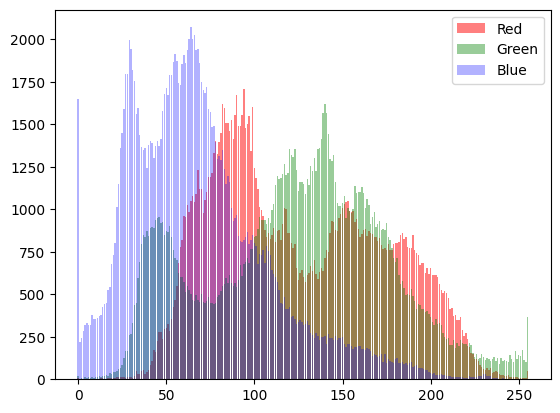

In [44]:


# Compute the histogram of the image
pl = im.histogram()

# Plot histogram for the Red channel (first 256 values)
plt.bar(range(256), pl[:256], color='r', alpha=0.5, label='Red')

# Plot histogram for the Green channel (next 256 values)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4, label='Green')

# Plot histogram for the Blue channel (last 256 values)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3, label='Blue')

# Display the legend
plt.legend()

# Show the histogram
plt.show()


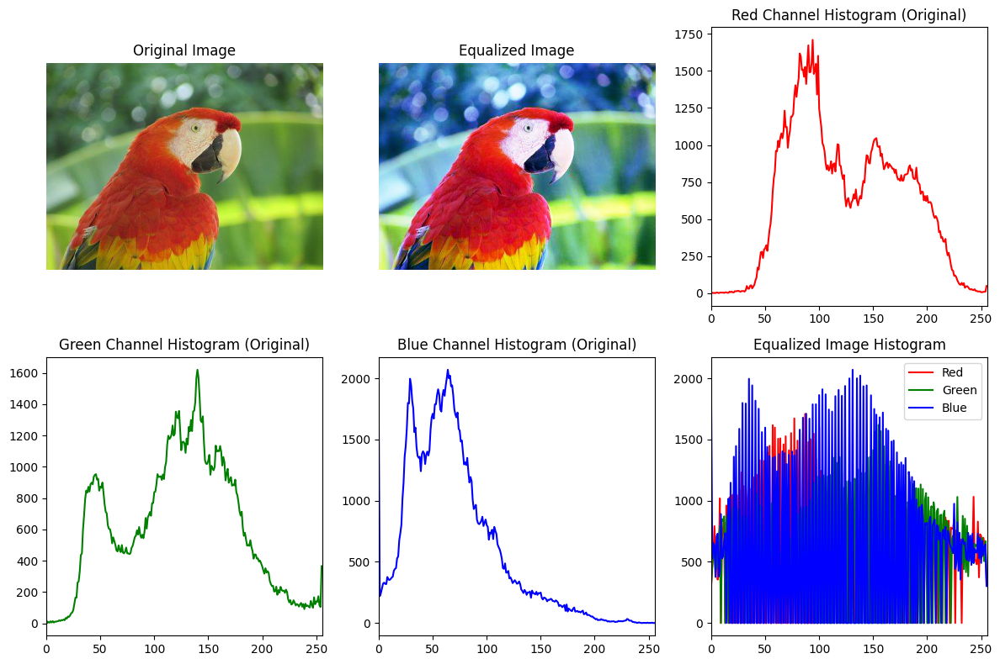

In [45]:


# Load an RGB image
image = cv2.imread('/content/parrot.png')  # Replace with your image path

# Convert image to RGB (OpenCV loads images in BGR by default)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Separate the image into R, G, B channels
r, g, b = cv2.split(image_rgb)

# Apply histogram equalization on each channel
r_equalized = cv2.equalizeHist(r)
g_equalized = cv2.equalizeHist(g)
b_equalized = cv2.equalizeHist(b)

# Merge the equalized channels back into an RGB image
equalized_image_rgb = cv2.merge([r_equalized, g_equalized, b_equalized])

# Calculate histograms for the original and equalized images
hist_r_original = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g_original = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b_original = cv2.calcHist([b], [0], None, [256], [0, 256])

hist_r_equalized = cv2.calcHist([r_equalized], [0], None, [256], [0, 256])
hist_g_equalized = cv2.calcHist([g_equalized], [0], None, [256], [0, 256])
hist_b_equalized = cv2.calcHist([b_equalized], [0], None, [256], [0, 256])

# Plot the original and equalized images along with their histograms
plt.figure(figsize=(12, 8))

# Plot original image
plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(image_rgb)
plt.axis('off')

# Plot equalized image
plt.subplot(2, 3, 2)
plt.title('Equalized Image')
plt.imshow(equalized_image_rgb)
plt.axis('off')

# Plot red channel histograms
plt.subplot(2, 3, 3)
plt.title('Red Channel Histogram (Original)')
plt.plot(hist_r_original, color='r')
plt.xlim([0, 256])

# Plot green channel histograms
plt.subplot(2, 3, 4)
plt.title('Green Channel Histogram (Original)')
plt.plot(hist_g_original, color='g')
plt.xlim([0, 256])

# Plot blue channel histograms
plt.subplot(2, 3, 5)
plt.title('Blue Channel Histogram (Original)')
plt.plot(hist_b_original, color='b')
plt.xlim([0, 256])

# Plot equalized histograms for each channel
plt.subplot(2, 3, 6)
plt.title('Equalized Image Histogram')
plt.plot(hist_r_equalized, color='r', label='Red')
plt.plot(hist_g_equalized, color='g', label='Green')
plt.plot(hist_b_equalized, color='b', label='Blue')
plt.xlim([0, 256])
plt.legend()

# Show the plots
plt.tight_layout()
plt.show()


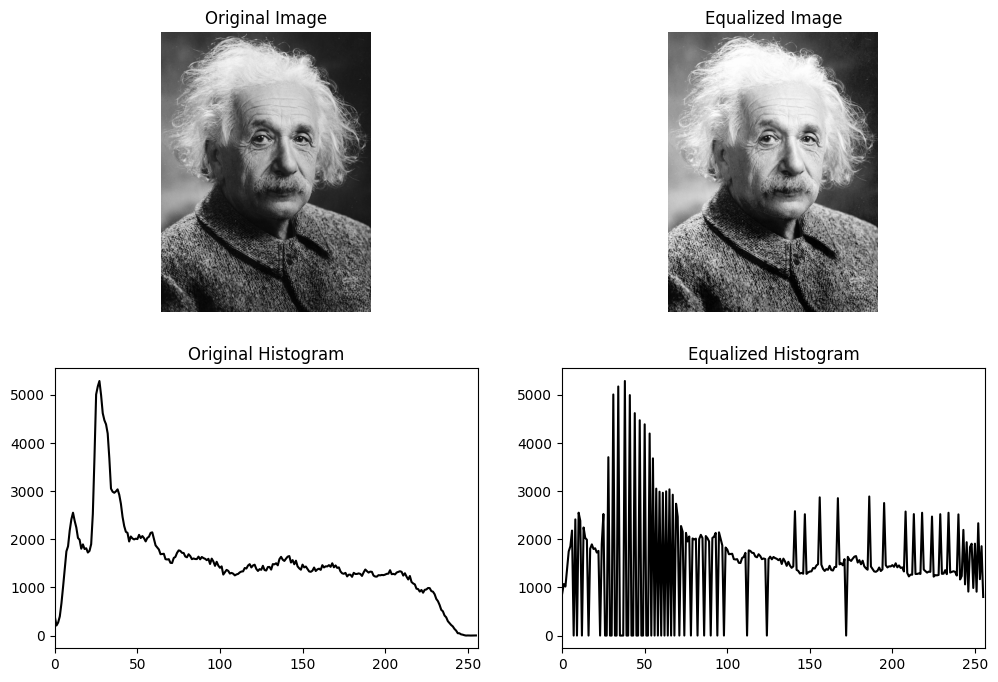

In [46]:


# Load a grayscale image
image = cv2.imread('/content/einstein.jpg', cv2.IMREAD_GRAYSCALE)  # Read image in grayscale mode

# Apply histogram equalization to enhance contrast
equalized_image = cv2.equalizeHist(image)

# Calculate histograms for the original and equalized images
hist_original = cv2.calcHist([image], [0], None, [256], [0, 256])  # Histogram of original image
hist_equalized = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])  # Histogram of equalized image

# Create a figure to display images and histograms
plt.figure(figsize=(12, 8))  # Set figure size

# Display the original image
plt.subplot(2, 2, 1)  # 2 rows, 2 columns, position 1
plt.title('Original Image')  # Title for the image
plt.imshow(image, cmap='gray')  # Display grayscale image
plt.axis('off')  # Hide axes

# Display the histogram-equalized image
plt.subplot(2, 2, 2)  # 2 rows, 2 columns, position 2
plt.title('Equalized Image')  # Title for the equalized image
plt.imshow(equalized_image, cmap='gray')  # Display grayscale image
plt.axis('off')  # Hide axes

# Plot the histogram of the original image
plt.subplot(2, 2, 3)  # 2 rows, 2 columns, position 3
plt.title('Original Histogram')  # Title for histogram
plt.plot(hist_original, color='black')  # Plot histogram with black color
plt.xlim([0, 256])  # Limit x-axis range to [0, 256]

# Plot the histogram of the equalized image
plt.subplot(2, 2, 4)  # 2 rows, 2 columns, position 4
plt.title('Equalized Histogram')  # Title for histogram
plt.plot(hist_equalized, color='black')  # Plot histogram with black color
plt.xlim([0, 256])  # Limit x-axis range to [0, 256]

# Display all plots
plt.show()


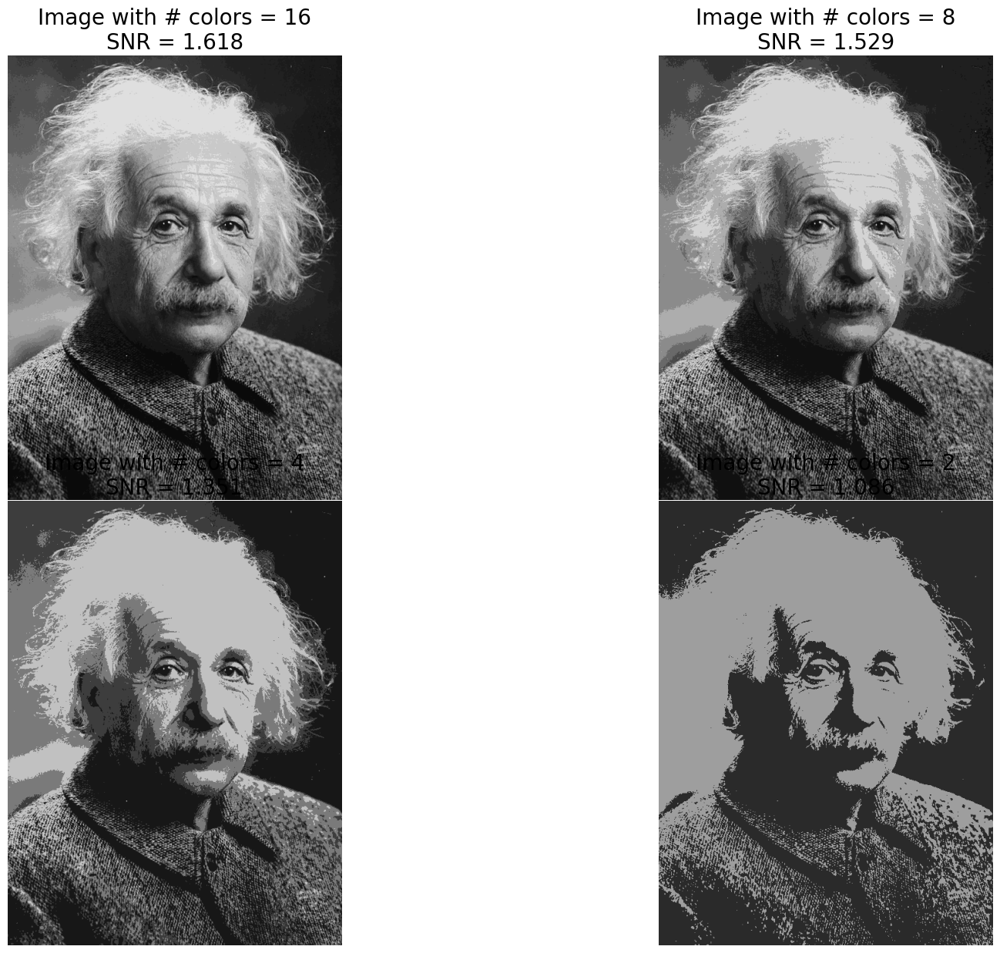

In [47]:
im = Image.open('/content/einstein.jpg')

pylab.figure(figsize=(20, 30))

num_colors_list = [1 << n for n in range(4, 0, -1)]
snr_list = []

def signaltonoise(arr):
    return np.mean(arr) / (np.std(arr) + 1e-10)

for i, num_colors in enumerate(num_colors_list, start=1):
    im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
    im1_array = np.array(im1)
    snr_value = signaltonoise(im1_array)
    snr_list.append(snr_value)

    pylab.subplot(4, 2, i)
    pylab.imshow(im1, cmap='gray')
    pylab.axis('off')
    pylab.title(f'Image with # colors = {num_colors}\nSNR = {snr_value:.3f}', size=20)

pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

In [48]:
im = Image.open("/content/einstein.jpg")

In [49]:
s = stat.Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255)]
[388800]
[100.39698816872428]
[89]
[66.88813446020701]


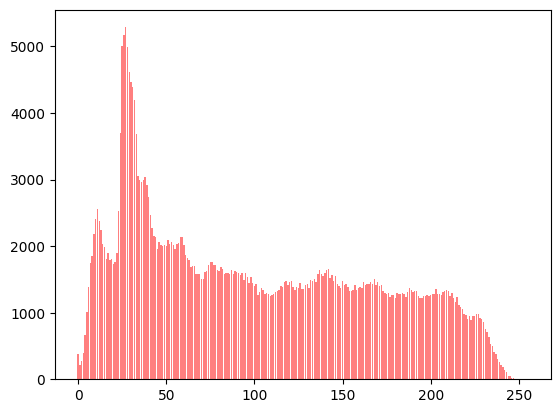

In [50]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)

plt.show()